In [6]:
from ucimlrepo import fetch_ucirepo
from implementations import bayes
from implementations import id3
from implementations import random_forest
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
from typing import Tuple
import pandas as pd
import time
import importlib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import random
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt

In [7]:
X = np.genfromtxt("../data_processed/credit_score/percentiles/X.csv",
                   delimiter=",",
                   dtype=None,
                   encoding="utf-8",
                   names=None)
l = len(X[0])
xx = np.zeros([X.shape[0], l])
for i in range(X.shape[0]):
    for j in range(l):
        xx[i,j] = X[i][j]
X = xx
y = np.loadtxt("../data_processed/credit_score/percentiles/y.csv", dtype=float, delimiter=",")


[7.84149056e-14 1.99437142e-11 2.65440748e-11] 1.0
[2.02584655e-11 6.68106483e-12 6.72975355e-15] 0.0
[5.52975881e-19 2.70828919e-15 1.68299562e-12] 2.0
[4.96273507e-16 1.00913180e-12 2.82871865e-12] 0.0
[2.58149353e-13 2.60116517e-11 1.48181312e-11] 0.0
[4.01684800e-15 7.85592931e-14 5.99197259e-16] 1.0
[2.07740379e-16 9.53502888e-14 2.11998835e-13] 2.0
[1.89844880e-12 1.00340118e-14 5.77692349e-21] 1.0
[1.91703739e-13 1.96060890e-11 1.18156156e-11] 1.0
[1.06244788e-12 1.31845725e-11 1.15351338e-12] 1.0
[1.10631225e-11 3.82155179e-10 3.59233012e-11] 1.0
[8.14697048e-12 3.26403789e-14 7.32929299e-21] 1.0
[1.67048671e-14 1.67017061e-12 6.87503745e-12] 0.0
[2.25960110e-11 2.40762334e-12 1.64871901e-16] 1.0
[1.33388145e-12 1.12683762e-11 6.80976033e-13] 2.0
[2.49685158e-14 9.48548476e-12 1.29183824e-11] 1.0
[5.46025401e-15 8.24824605e-12 1.58400371e-10] 1.0
[4.79287249e-11 1.35464556e-10 1.30299572e-13] 1.0
[2.82693513e-11 1.91159187e-13 5.74937881e-20] 0.0
[2.60563523e-12 1.60881211e-10 

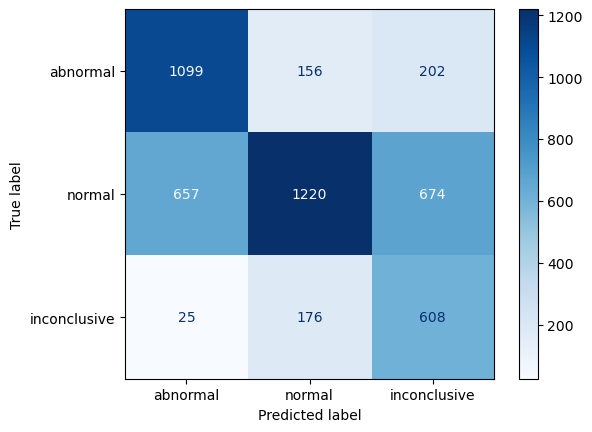

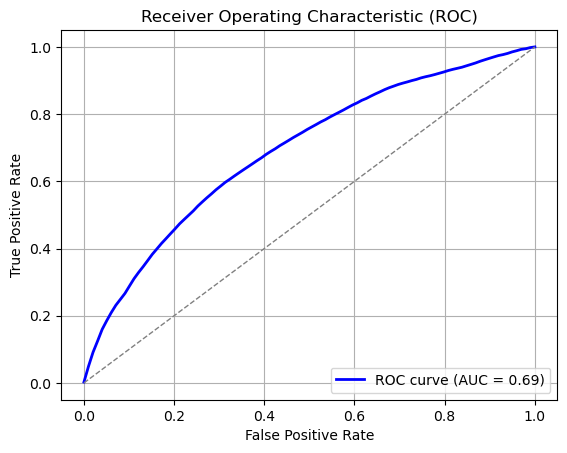

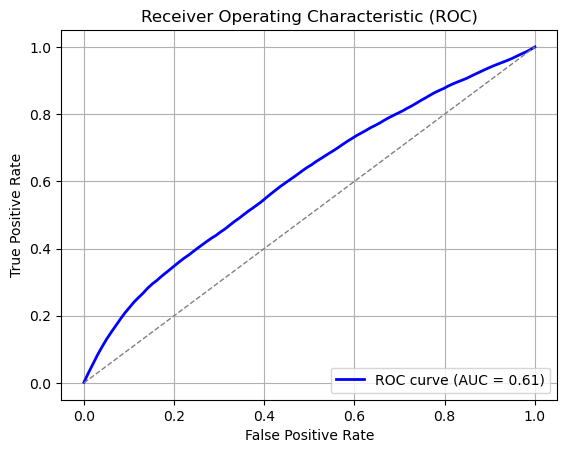

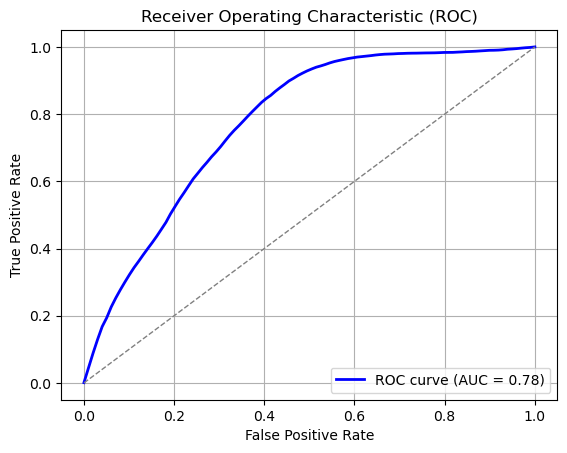

In [13]:
#################### BAYES
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    bay = bayes.NaiveBayes()
    bay.fit(x_train, y_train)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = bay.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")

cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[1. 0. 0.] 0.0
[0. 1. 0.] 1.0
[0. 0. 1.] 1.0
[1. 0. 0.] 0.0
[0. 1. 0.] 1.0
[0. 0. 1.] 2.0
[0. 1. 0.] 2.0
[1. 0. 0.] 1.0
[0. 1. 0.] 1.0
[0. 0. 1.] 2.0
[0. 1. 0.] 1.0
[1. 0. 0.] 0.0
[0. 0. 1.] 1.0
[1. 0. 0.] 1.0
[1. 0. 0.] 0.0
[1. 0. 0.] 0.0
[0. 1. 0.] 1.0
[1. 0. 0.] 1.0
[1. 0. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[1. 0. 0.] 0.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 0. 1.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 0. 1.] 0.0
[0. 1. 0.] 1.0
[0. 0. 1.] 0.0
[0. 1. 0.] 1.0
[1. 0. 0.] 1.0
[0. 1. 0.] 2.0
[0. 0. 1.] 2.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[1. 0. 0.] 1.0
[0. 1. 0.] 1.0
[1. 0. 0.] 0.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[1. 0. 0.] 0.0
[0. 1. 0.] 1.0
[0. 0. 1.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 0.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[0. 1. 0.] 1.0
[1. 0. 0.] 1.0
[0. 1. 0.] 1.0
[1. 0. 0.] 1.0
[0. 0. 1.] 2.0
[0. 1. 0.] 1.0
[1. 0. 0.] 0.0
[1. 0. 0.] 1.0
[1. 0. 0.] 1.0
[0. 1. 0.] 2.0
[0. 1. 0.] 1.0
[0. 1. 0.]

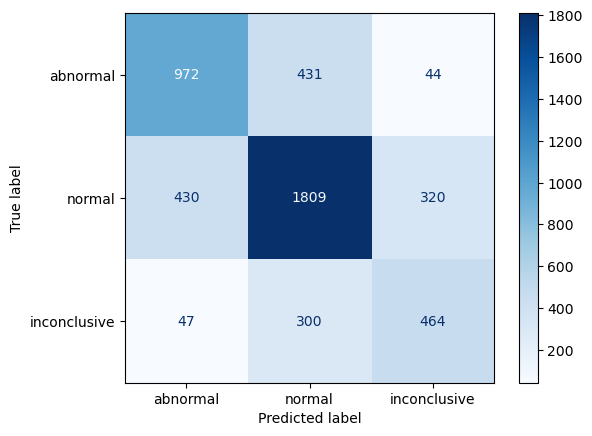

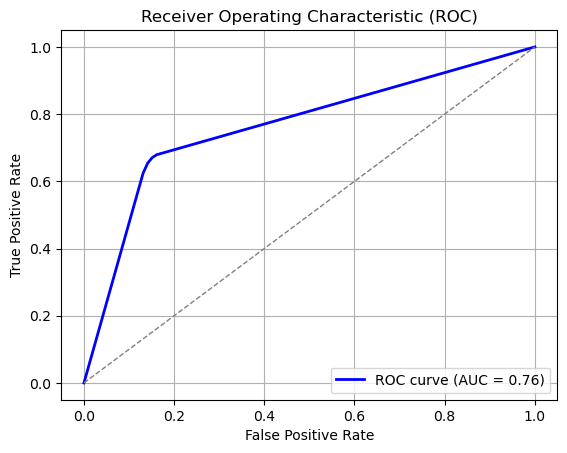

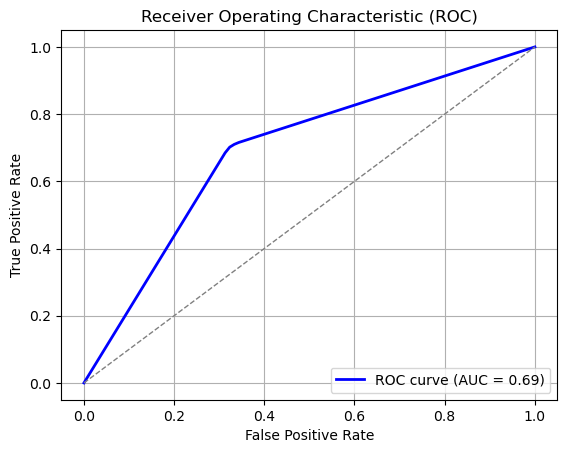

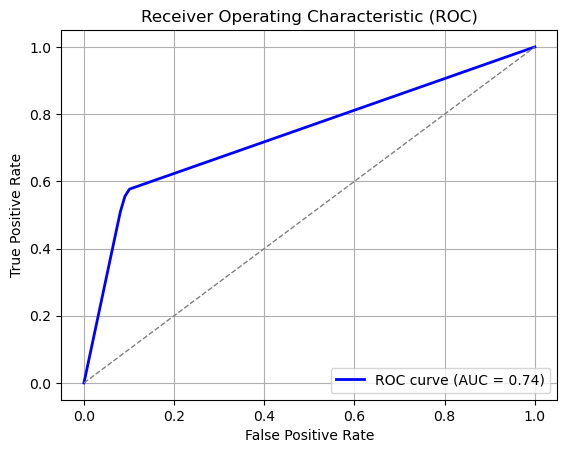

In [14]:
#################### ID3
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    tree = id3.DecisionTreeClassifier(1e10)
    tree.fit(x_train, y_train)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = tree.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")


cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0.12 0.7  0.18] 0.0
[0.86 0.14 0.  ] 0.0
[0.78 0.2  0.02] 0.0
[0.5  0.46 0.04] 1.0
[0.08 0.76 0.16] 1.0
[0.   0.98 0.02] 1.0
[0. 1. 0.] 1.0
[0.44 0.54 0.02] 0.0
[0.84 0.16 0.  ] 1.0
[0.1  0.82 0.08] 1.0
[0.88 0.12 0.  ] 0.0
[0.08 0.54 0.38] 2.0
[0.04 0.3  0.66] 2.0
[0.66 0.3  0.04] 1.0
[0.28 0.72 0.  ] 1.0
[0.1 0.8 0.1] 1.0
[0.08 0.9  0.02] 1.0
[0.04 0.9  0.06] 1.0
[0.72 0.28 0.  ] 1.0
[0.02 0.14 0.84] 1.0
[0.7  0.26 0.04] 0.0
[0.22 0.76 0.02] 1.0
[0.1  0.84 0.06] 0.0
[0.  0.8 0.2] 1.0
[0.78 0.2  0.02] 0.0
[0.06 0.18 0.76] 2.0
[0.08 0.48 0.44] 0.0
[0.56 0.4  0.04] 1.0
[0.   0.38 0.62] 1.0
[0.82 0.18 0.  ] 0.0
[0.66 0.32 0.02] 0.0
[0.02 0.96 0.02] 1.0
[0.   0.18 0.82] 2.0
[0.32 0.64 0.04] 1.0
[0.3  0.68 0.02] 1.0
[0.02 0.34 0.64] 2.0
[0.04 0.52 0.44] 2.0
[0.8  0.18 0.02] 0.0
[0.06 0.86 0.08] 1.0
[0.6 0.4 0. ] 1.0
[0.04 0.92 0.04] 1.0
[0.08 0.86 0.06] 0.0
[0.02 0.68 0.3 ] 1.0
[0.02 0.98 0.  ] 0.0
[0.06 0.84 0.1 ] 1.0
[0.06 0.82 0.12] 2.0
[0.02 0.92 0.06] 1.0
[0.8 0.2 0. ] 0.0
[0.04 0.64

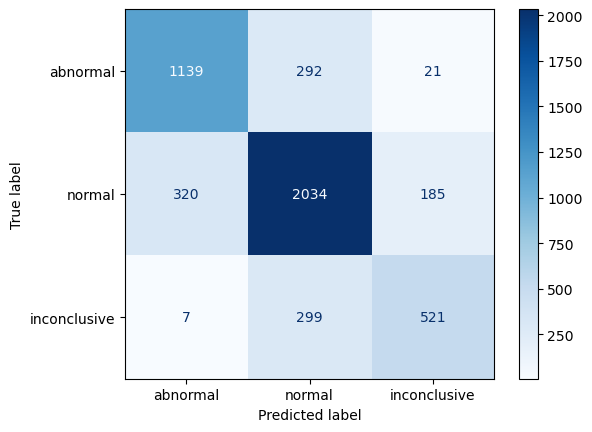

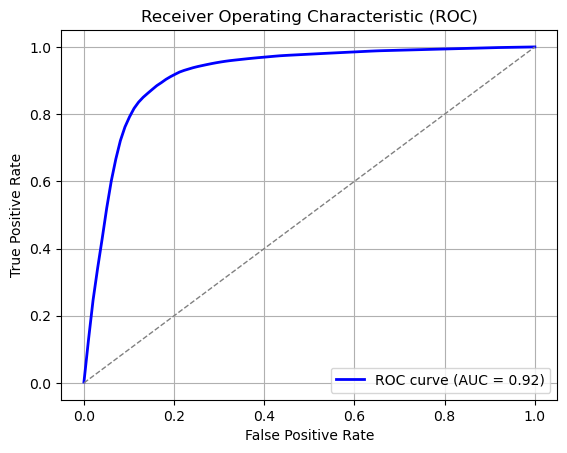

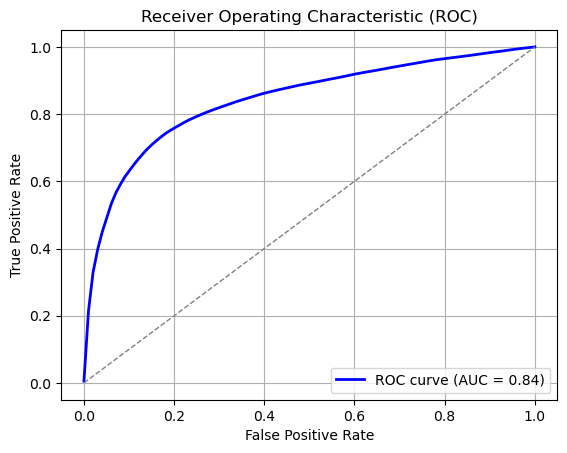

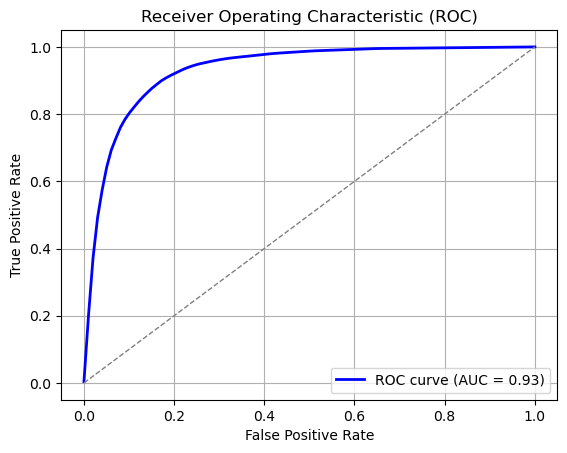

In [15]:
#################### RANDOM FOREST ID3 100%
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    rfc = random_forest.RandomForestClassifier(classifiers_number=50)
    rfc.fit(x_train, y_train, tree_percentage=1.0)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = rfc.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")


cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

[0.94 0.06 0.  ] 0.0
[0.02 0.82 0.16] 2.0
[0.02 0.96 0.02] 1.0
[0.88 0.12 0.  ] 0.0
[0.14 0.28 0.58] 1.0
[0.26 0.16 0.58] 0.0
[0.06 0.08 0.86] 2.0
[0.   0.96 0.04] 1.0
[0.1  0.62 0.28] 1.0
[0.16 0.82 0.02] 1.0
[0.34 0.48 0.18] 0.0
[0.84 0.16 0.  ] 0.0
[1. 0. 0.] 0.0
[0.28 0.1  0.62] 0.0
[0.02 0.76 0.22] 0.0
[0.74 0.26 0.  ] 0.0
[0.8 0.2 0. ] 0.0
[0.14 0.82 0.04] 0.0
[0.64 0.36 0.  ] 0.0
[0.86 0.14 0.  ] 1.0
[0.72 0.28 0.  ] 1.0
[0.   0.98 0.02] 1.0
[0.84 0.16 0.  ] 0.0
[0.04 0.32 0.64] 2.0
[0.06 0.22 0.72] 2.0
[0.9 0.1 0. ] 1.0
[0.82 0.18 0.  ] 0.0
[0.64 0.36 0.  ] 1.0
[0.86 0.14 0.  ] 0.0
[0.62 0.36 0.02] 1.0
[0.   0.98 0.02] 1.0
[0.7 0.3 0. ] 1.0
[0.04 0.14 0.82] 2.0
[0.9 0.1 0. ] 0.0
[0.04 0.92 0.04] 1.0
[0.   0.98 0.02] 1.0
[0.34 0.64 0.02] 0.0
[0.8 0.2 0. ] 0.0
[0.  0.2 0.8] 2.0
[0.06 0.84 0.1 ] 1.0
[0.92 0.08 0.  ] 0.0
[0.6 0.4 0. ] 1.0
[0.04 0.74 0.22] 2.0
[0.32 0.12 0.56] 1.0
[0.02 0.14 0.84] 2.0
[0.26 0.68 0.06] 1.0
[0.06 0.92 0.02] 1.0
[0.02 0.08 0.9 ] 2.0
[0.28 0.14 0.58] 0.

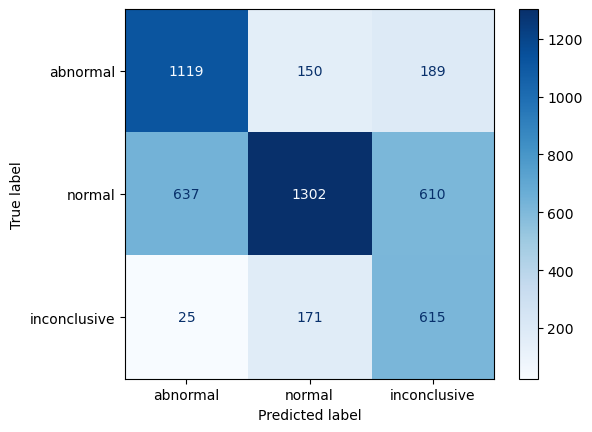

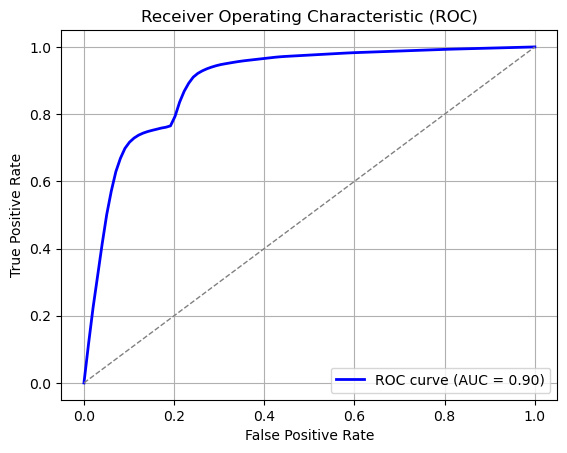

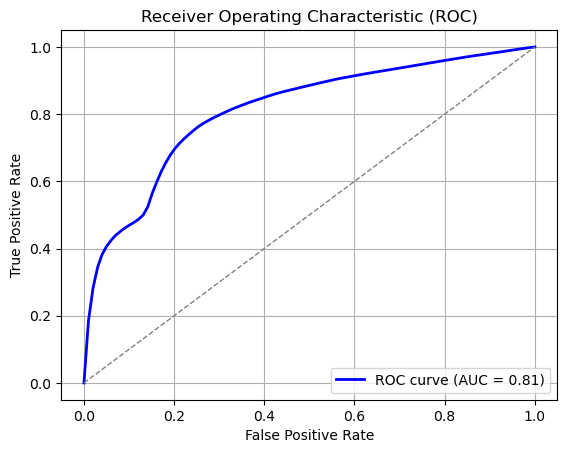

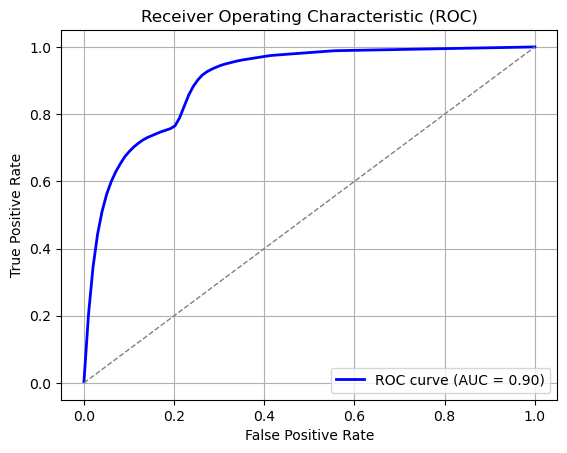

In [16]:
#################### RANDOM FOREST ID3/BAYES 50/50
importlib.reload(random_forest)
accuracies = []
time1 = time.time()

fpr_list0 = []
tpr_list0 = []
auc_list0 = []
fpr_list1 = []
tpr_list1 = []
auc_list1 = []
fpr_list2 = []
tpr_list2 = []
auc_list2 = []
y_testing = []
y_pred = []
for licznik in range(25):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=random.randrange(200))
    rfc = random_forest.RandomForestClassifier(classifiers_number=50)
    rfc.fit(x_train, y_train, tree_percentage=0.5)

    samples = len(y_test)
    correctly_predicted = 0
    scores0 = [] #####################
    scores1 = [] #####################
    scores2 = [] #####################
    for sample, gt in zip(x_test, y_test):
        prediction = rfc.predict(sample)
        scores0.append(prediction[0]) #############333
        scores1.append(prediction[1])
        scores2.append(prediction[2])
        y_pred.append(np.argmax(prediction))
        y_testing.append(gt)
        print(prediction, gt)
        if np.argmax(prediction) == gt:
            correctly_predicted += 1
    y_test0 = []
    y_test1 = []
    y_test2 = []
    for yyy in y_test:
        if yyy == 0:
            y_test0.append(1)
            y_test1.append(0)
            y_test2.append(0)
        if yyy == 1:
            y_test0.append(0)
            y_test1.append(1)
            y_test2.append(0)
        if yyy == 2:
            y_test0.append(0)
            y_test1.append(0)
            y_test2.append(1)

    fpr0, tpr0, _ = roc_curve(y_test0, scores0)
    roc_auc0 = auc(fpr0, tpr0)
    fpr_list0.append(fpr0)
    tpr_list0.append(tpr0)
    auc_list0.append(roc_auc0)

    fpr1, tpr1, _ = roc_curve(y_test1, scores1)
    roc_auc1 = auc(fpr1, tpr1)
    fpr_list1.append(fpr1)
    tpr_list1.append(tpr1)
    auc_list1.append(roc_auc1)

    fpr2, tpr2, _ = roc_curve(y_test2, scores2)
    roc_auc2 = auc(fpr2, tpr2)
    fpr_list2.append(fpr2)
    tpr_list2.append(tpr2)
    auc_list2.append(roc_auc2)

    print(f"Accuracy: {(correctly_predicted / samples) * 100:.2f}%")
    print(f"Elapsed time: {time.time()-time1:.2f} s")
    accuracies.append((correctly_predicted / samples) * 100)
    print(f"Próbka numer {licznik+1}")
print(f"Mean accuracy: {np.mean(accuracies):.2f}%")
print(f"Accuracy min: {min(accuracies):.2f}%, max: {max(accuracies):.2f}%")
print(f"Accuracy standard deviation: {np.std(accuracies):.2f}%")



cm = confusion_matrix(y_testing, y_pred, labels=[0, 1, 2])
cm = cm//25
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=["abnormal", "normal", "inconclusive"])
disp.plot(cmap=plt.cm.Blues)
plt.show()


# Define a common set of FPR values
mean_fpr0 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp0 = [np.interp(mean_fpr0, fpr0, tpr0) for fpr0, tpr0 in zip(fpr_list0, tpr_list0)]
# Average the interpolated TPR values
mean_tpr0 = np.mean(tpr_interp0, axis=0)
# Compute the mean AUC
mean_auc0 = np.mean(auc_list0)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr0, mean_tpr0, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc0:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Define a common set of FPR values
mean_fpr1 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp1 = [np.interp(mean_fpr1, fpr1, tpr1) for fpr1, tpr1 in zip(fpr_list1, tpr_list1)]
# Average the interpolated TPR values
mean_tpr1 = np.mean(tpr_interp1, axis=0)
# Compute the mean AUC
mean_auc1 = np.mean(auc_list1)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr1, mean_tpr1, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Define a common set of FPR values
mean_fpr2 = np.linspace(0, 1, 100)
# Interpolate TPR values
tpr_interp2 = [np.interp(mean_fpr2, fpr2, tpr2) for fpr2, tpr2 in zip(fpr_list2, tpr_list2)]
# Average the interpolated TPR values
mean_tpr2 = np.mean(tpr_interp2, axis=0)
# Compute the mean AUC
mean_auc2 = np.mean(auc_list2)
# Plot ROC curve
plt.figure()
plt.plot(mean_fpr2, mean_tpr2, color='blue', lw=2, label=f'ROC curve (AUC = {mean_auc2:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid()
plt.show()